In [1]:
#pip install nltk #Natural Language Toolkit

In [2]:
#pip install textblob

In [3]:
#pip install wordcloud

In [4]:
import pandas as pd
import string
import numpy as np
import nltk
import matplotlib.pyplot as plt
import seaborn as sns

In [5]:
pip install -U imbalanced-learn

Note: you may need to restart the kernel to use updated packages.


In [145]:
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import plot_confusion_matrix

In [7]:
nltk.download()

showing info https://raw.githubusercontent.com/nltk/nltk_data/gh-pages/index.xml


True

In [8]:
df = pd.read_csv("C:\\Users\\thaku\\Downloads\\premierleague.csv")

In [9]:
df.shape

(60139, 27)

In [10]:
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

In [11]:
df.head(2)

,url,date,content,renderedContent,id,user,replyCount,retweetCount,likeCount,quoteCount,conversationId,lang,source,sourceUrl,sourceLabel,outlinks,tcooutlinks,media,retweetedTweet,quotedTweet,inReplyToTweetId,inReplyToUser,mentionedUsers,coordinates,place,hashtags,cashtags
0,https://twitter.com/NickGolding4/status/152924...,2022-05-24 23:56:19+00:00,"Strange one this, Guardiola is the obvious cho...","Strange one this, Guardiola is the obvious cho...",1529249967868678145,"{'username': 'NickGolding4', 'id': 96863181579...",0,0,0,0,1529249967868678145,en,"<a href=""http://twitter.com/download/iphone"" r...",http://twitter.com/download/iphone,Twitter for iPhone,['https://twitter.com/skysportspl/status/15292...,['https://t.co/9nGcvH3oob'],NaN,NaN,{'url': 'https://twitter.com/SkySportsPL/statu...,NaN,NaN,NaN,"{'longitude': 0.42871, 'latitude': 51.283861}","{'fullName': 'Ditton, South East', 'name': 'Di...",['PremierLeague'],NaN
1,https://twitter.com/fansnetwork/status/1529249...,2022-05-24 23:54:26+00:00,Raphinha submits transfer request but Leeds on...,Raphinha submits transfer request but Leeds on...,1529249495539654659,"{'username': 'fansnetwork', 'id': 126313186, '...",0,0,1,0,1529249495539654659,en,"<a href=""https://ifttt.com"" rel=""nofollow"">IFT...",https://ifttt.com,IFTTT,['https://ift.tt/b1dRESG'],['https://t.co/NrGXFeKTus'],NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"['lufc', 'lufc', 'premierleague']",NaN


In [12]:
df.tail(2)

,url,date,content,renderedContent,id,user,replyCount,retweetCount,likeCount,quoteCount,conversationId,lang,source,sourceUrl,sourceLabel,outlinks,tcooutlinks,media,retweetedTweet,quotedTweet,inReplyToTweetId,inReplyToUser,mentionedUsers,coordinates,place,hashtags,cashtags
60137,https://twitter.com/EnglishPre_b/status/152055...,2022-05-01 00:03:55+00:00,I prefer to feel the pressure - Guardiola reli...,I prefer to feel the pressure - Guardiola reli...,1520554574611812352,"{'username': 'EnglishPre_b', 'id': 10540677089...",0,0,0,0,1520554574611812352,en,"<a href=""https://www.plow.io/anchor/English_Pr...",https://www.plow.io/anchor/English_Premier_League,EnglishPre_Plow,['https://briefly.co/anchor/English_Premier_Le...,['https://t.co/D3QrpNznGN'],NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"['EPL', 'premierleague']",NaN
60138,https://twitter.com/Betting_Offers2/status/152...,2022-05-01 00:00:07+00:00,Betting has never been better With Coral\nAvai...,Betting has never been better With Coral\nAvai...,1520553617517944832,"{'username': 'Betting_Offers2', 'id': 48995881...",0,0,0,0,1520553617517944832,en,"<a href=""https://twittimer.com"" rel=""nofollow""...",https://twittimer.com,Twittimer,['https://mediaserver.entainpartners.com/rende...,['https://t.co/1Di5RX1wid'],[{'previewUrl': 'https://pbs.twimg.com/media/F...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"['PremierLeague', 'EFL', 'Football', 'betting'...",NaN


In [13]:
df.sample(n=2)

,url,date,content,renderedContent,id,user,replyCount,retweetCount,likeCount,quoteCount,conversationId,lang,source,sourceUrl,sourceLabel,outlinks,tcooutlinks,media,retweetedTweet,quotedTweet,inReplyToTweetId,inReplyToUser,mentionedUsers,coordinates,place,hashtags,cashtags
1258,https://twitter.com/kimmiboskovic/status/15288...,2022-05-23 19:02:07+00:00,We are the Champions! #Champions #ManchesterCi...,We are the Champions! #Champions #ManchesterCi...,1528813541842640897,"{'username': 'kimmiboskovic', 'id': 1252510052...",0,1,3,0,1528813541842640897,en,"<a href=""http://twitter.com/download/android"" ...",http://twitter.com/download/android,Twitter for Android,NaN,NaN,[{'thumbnailUrl': 'https://pbs.twimg.com/ext_t...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"['Champions', 'ManchesterCity', 'ManCity', 'Pr...",NaN
39432,https://twitter.com/amric_sobczak/status/15255...,2022-05-14 17:57:30+00:00,@AbsoluteChelsea is it common in the #PremierL...,@AbsoluteChelsea is it common in the #PremierL...,1525535790045880321,"{'username': 'amric_sobczak', 'id': 1379438635...",0,0,0,0,1525535790045880321,en,"<a href=""http://twitter.com/download/iphone"" r...",http://twitter.com/download/iphone,Twitter for iPhone,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[{'username': 'AbsoluteChelsea', 'id': 4504718...",NaN,NaN,"['PremierLeague', 'FACupFinal', 'Chelsea', 'CH...",NaN


In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60139 entries, 0 to 60138
Data columns (total 27 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   url               60139 non-null  object 
 1   date              60139 non-null  object 
 2   content           60139 non-null  object 
 3   renderedContent   60139 non-null  object 
 4   id                60139 non-null  int64  
 5   user              60139 non-null  object 
 6   replyCount        60139 non-null  int64  
 7   retweetCount      60139 non-null  int64  
 8   likeCount         60139 non-null  int64  
 9   quoteCount        60139 non-null  int64  
 10  conversationId    60139 non-null  int64  
 11  lang              60139 non-null  object 
 12  source            60139 non-null  object 
 13  sourceUrl         60139 non-null  object 
 14  sourceLabel       60139 non-null  object 
 15  outlinks          16592 non-null  object 
 16  tcooutlinks       16592 non-null  object

In [15]:
df.describe()

,id,replyCount,retweetCount,likeCount,quoteCount,conversationId,retweetedTweet,inReplyToTweetId
count,6.013900e+04,60139.000000,60139.000000,60139.000000,60139.000000,6.013900e+04,0.0,2.826000e+03
mean,1.526286e+18,0.433163,0.766075,6.641464,0.124312,1.526211e+18,NaN,1.525860e+18
std,2.480254e+15,5.363178,13.942159,188.575098,2.867641,3.875208e+15,NaN,6.485704e+15
min,1.520554e+18,0.000000,0.000000,0.000000,0.000000,1.134944e+18,NaN,1.276614e+18
25%,1.524291e+18,0.000000,0.000000,0.000000,0.000000,1.524275e+18,NaN,1.524051e+18
50%,1.527375e+18,0.000000,0.000000,0.000000,0.000000,1.527373e+18,NaN,1.527269e+18
75%,1.528417e+18,0.000000,0.000000,2.000000,0.000000,1.528417e+18,NaN,1.528400e+18
max,1.529250e+18,595.000000,2187.000000,36403.000000,446.000000,1.529250e+18,NaN,1.529221e+18


In [16]:
df.isnull().sum()

url                     0
date                    0
content                 0
renderedContent         0
id                      0
user                    0
replyCount              0
retweetCount            0
likeCount               0
quoteCount              0
conversationId          0
lang                    0
source                  0
sourceUrl               0
sourceLabel             0
outlinks            43547
tcooutlinks         43547
media               40123
retweetedTweet      60139
quotedTweet         56811
inReplyToTweetId    57313
inReplyToUser       57313
mentionedUsers      48034
coordinates         57753
place               57753
hashtags               12
cashtags            60124
dtype: int64

In [17]:
df['date'] =pd.to_datetime(df['date'])

In [18]:
df['content'] = df['content'].astype('string')

In [19]:
df["date"].max()

Timestamp('2022-05-24 23:56:19+0000', tz='UTC')

In [20]:
df["date"].min()

Timestamp('2022-05-01 00:00:07+0000', tz='UTC')

In [21]:
df.dtypes

url                              object
date                datetime64[ns, UTC]
content                          string
renderedContent                  object
id                                int64
user                             object
replyCount                        int64
retweetCount                      int64
likeCount                         int64
quoteCount                        int64
conversationId                    int64
lang                             object
source                           object
sourceUrl                        object
sourceLabel                      object
outlinks                         object
tcooutlinks                      object
media                            object
retweetedTweet                  float64
quotedTweet                      object
inReplyToTweetId                float64
inReplyToUser                    object
mentionedUsers                   object
coordinates                      object
place                            object


In [22]:
df['coordinates'].head(7)

0    {'longitude': 0.42871, 'latitude': 51.283861}
1                                              NaN
2                                              NaN
3                                              NaN
4                                              NaN
5                                              NaN
6                                              NaN
Name: coordinates, dtype: object

In [23]:
df = df.drop(['outlinks','tcooutlinks','media','retweetedTweet','quotedTweet','inReplyToTweetId' ,'inReplyToUser' ,
              'mentionedUsers' ,'coordinates' ,'place' ,'hashtags','cashtags'],axis = 1)

In [24]:
df = df.loc[:, ["id","user","date","content","likeCount","retweetCount","replyCount","lang","sourceLabel"]]

In [25]:
df.head(2)

,id,user,date,content,likeCount,retweetCount,replyCount,lang,sourceLabel
0,1529249967868678145,"{'username': 'NickGolding4', 'id': 96863181579...",2022-05-24 23:56:19+00:00,"Strange one this, Guardiola is the obvious cho...",0,0,0,en,Twitter for iPhone
1,1529249495539654659,"{'username': 'fansnetwork', 'id': 126313186, '...",2022-05-24 23:54:26+00:00,Raphinha submits transfer request but Leeds on...,1,0,0,en,IFTTT


In [26]:
df.rename(columns ={'date':'Date','content':'Tweets' , 'id' :'Id' ,'user':'User_name','replyCount':'Reply',
                          'retweetCount':'Re-tweets' , 'likeCount':'Likes', 'lang ':'Language' ,'sourceLabel':'Source'},inplace =True)

In [27]:
df.head(2)

,Id,User_name,Date,Tweets,Likes,Re-tweets,Reply,lang,Source
0,1529249967868678145,"{'username': 'NickGolding4', 'id': 96863181579...",2022-05-24 23:56:19+00:00,"Strange one this, Guardiola is the obvious cho...",0,0,0,en,Twitter for iPhone
1,1529249495539654659,"{'username': 'fansnetwork', 'id': 126313186, '...",2022-05-24 23:54:26+00:00,Raphinha submits transfer request but Leeds on...,1,0,0,en,IFTTT


In [28]:
df['Tweets'].duplicated().sum()

279

In [29]:
df.drop_duplicates(subset ="Tweets" , keep= False , inplace = True)

In [30]:
df['Tweets'].duplicated().sum()

0

In [31]:
df.dtypes

Id                         int64
User_name                 object
Date         datetime64[ns, UTC]
Tweets                    string
Likes                      int64
Re-tweets                  int64
Reply                      int64
lang                      object
Source                    object
dtype: object

In [32]:
import re #regular expression matching operations similar to 

In [33]:
df['Tweets'].head(2)

0    Strange one this, Guardiola is the obvious cho...
1    Raphinha submits transfer request but Leeds on...
Name: Tweets, dtype: string

In [34]:
def remove_urls (text):
    text = re.sub(r'(https|http)?:\/\/(\w|\.|\/|\?|\=|\&|\%)*\b', '', text)
    return(text)

In [35]:
df['cleaned_tweets']= df['Tweets'].apply(remove_urls)

In [36]:
df['cleaned_tweets']= df['cleaned_tweets'].apply(lambda x: re.sub('[^A-Za-z0-9]', ' ',x))

In [37]:
df['cleaned_tweets']= df['cleaned_tweets'].apply(lambda x: re.sub(r'[^\w\s]' ,' ', x))

In [38]:
df['cleaned_tweets']= df['cleaned_tweets'].apply(lambda x: re.sub("\d+" ,'', x))

In [39]:
df['cleaned_tweets'].head(6)

0    Strange one this  Guardiola is the obvious cho...
1    Raphinha submits transfer request but Leeds on...
2    Congratulations Boss   Very Well Deserved     ...
3      EPL  SEASON PREDICTIONS REVISITED   PremierL...
4    The Premier League ended   Manchester City sco...
5    We re so glad that J rgen is the manager of th...
Name: cleaned_tweets, dtype: object

In [40]:
df['cleaned_tweets'] = df['cleaned_tweets'].astype("string")

In [41]:
df['cleaned_tweets'].dtypes

string[python]

In [42]:
df["cleaned_tweets"] = df["cleaned_tweets"].str.lower()

In [43]:
df[["Tweets","cleaned_tweets"]].head(6)

,Tweets,cleaned_tweets
0,"Strange one this, Guardiola is the obvious cho...",strange one this guardiola is the obvious cho...
1,Raphinha submits transfer request but Leeds on...,raphinha submits transfer request but leeds on...
2,Congratulations Boss! Very Well Deserved!💪 🔴🔴...,congratulations boss very well deserved ...
3,2021-22 EPL: SEASON PREDICTIONS REVISITED #Pr...,epl season predictions revisited premierl...
4,The Premier League ended - Manchester City sco...,the premier league ended manchester city sco...
5,We're so glad that Jürgen is the manager of th...,we re so glad that j rgen is the manager of th...


In [44]:
from nltk.tokenize import word_tokenize

In [45]:
def tokenize(txt):
    tokens = re.split('\W+', txt)
    return tokens
df['cleaned_tweets'] = df['cleaned_tweets'].apply(tokenize)

In [46]:
df['cleaned_tweets'].head(3)

0    [strange, one, this, guardiola, is, the, obvio...
1    [raphinha, submits, transfer, request, but, le...
2    [congratulations, boss, very, well, deserved, ...
Name: cleaned_tweets, dtype: object

In [47]:
from nltk.corpus import stopwords

In [48]:
stopwords = nltk.corpus.stopwords.words('english')

#stopwords =update()
#stopwords[0:10]

stopwords

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [49]:
def remove_stopwords(txt_tokenized):
    txt_clean = [word for word in txt_tokenized if word not in stopwords]
    return txt_clean

df['cleaned_tweets'] = df['cleaned_tweets'].apply(remove_stopwords)

In [50]:
df['cleaned_tweets'] = df['cleaned_tweets'].astype('string')

In [51]:
df['cleaned_tweets'].head(4)

0    ['strange', 'one', 'guardiola', 'obvious', 'ch...
1    ['raphinha', 'submits', 'transfer', 'request',...
2    ['congratulations', 'boss', 'well', 'deserved'...
3    ['', 'epl', 'season', 'predictions', 'revisite...
Name: cleaned_tweets, dtype: string

In [52]:
#df['cleaned_tweets'].head(10)

df['cleaned_tweets'] = df.cleaned_tweets.str.replace(",", "")

In [53]:
df['cleaned_tweets'].head(4)

0    ['strange' 'one' 'guardiola' 'obvious' 'choice...
1    ['raphinha' 'submits' 'transfer' 'request' 'le...
2    ['congratulations' 'boss' 'well' 'deserved' 'y...
3    ['' 'epl' 'season' 'predictions' 'revisited' '...
Name: cleaned_tweets, dtype: string

In [54]:
df['Tweets'].head(4)                 

0    Strange one this, Guardiola is the obvious cho...
1    Raphinha submits transfer request but Leeds on...
2    Congratulations Boss! 
Very Well Deserved!💪
🔴🔴...
3    2021-22 EPL: SEASON PREDICTIONS REVISITED

#Pr...
Name: Tweets, dtype: string

In [55]:
from nltk.stem import WordNetLemmatizer

In [56]:
lemmatizer = WordNetLemmatizer()
def lemmatization(data):
        text = [lemmatizer.lemmatize(word) for word in data]
        return data

In [59]:
print(lemmatizer.lemmatize("submits"))
print(lemmatizer.lemmatize("best"))
print(lemmatizer.lemmatize("Leeds"))


submits
best
Leeds


In [60]:
df['lemmatized'] = df['cleaned_tweets'].apply(lemmatization)

In [61]:
df['lemmatized'].head(3)

0    ['strange' 'one' 'guardiola' 'obvious' 'choice...
1    ['raphinha' 'submits' 'transfer' 'request' 'le...
2    ['congratulations' 'boss' 'well' 'deserved' 'y...
Name: lemmatized, dtype: object

In [62]:

df['lemmatized']= df['lemmatized'].astype('string')

In [63]:
#stop_word = stopwords.words('english')
df['lemmatized'] = df.lemmatized.str.replace("'", " ")
#df.dtypes"

In [64]:
df['lemmatized']

0        [ strange   one   guardiola   obvious   choice...
1        [ raphinha   submits   transfer   request   le...
2        [ congratulations   boss   well   deserved   y...
3        [    epl   season   predictions   revisited   ...
4        [ premier   league   ended   manchester   city...
5        [ glad   j   rgen   manager   season   upthere...
6        [ gabriel   jesus   told   still   role   man ...
7        [ congratulations   best   manager   well   de...
8        [ premier   league   reece   james   min   g  ...
9        [    goal   lfc   manager   league   ignored  ...
10       [    kevindebruyne   assist   gundogan   maybe...
11       [ breaking   j   rgen   klopp   premier   leag...
12       [ jurgen   klopp   manager   season   premierl...
13       [ people   need   understand   award   premier...
14       [ struggling   understand   jurgenklopp   prem...
15       [ one   bird   jonathan   uofebusiness   virtu...
16       [ love   people   saying   liverpool   bottled.

In [65]:
newStopWords = ['amp', "zzzzz","aa","aaaaaa","aaaaaaaaa","aaaaaaaaaaaaaa","aaaaaah","aaaaaannddd","aaaaahhh","aaaaahhhhh","aaaaan","aaaah","aaah","aaand",
                "aaannnndddd","aaaron","aah","aaj","aana", "aave", "ab","aba" ,"abc","abcmotepe","abeegggg","abeg","abegg","abt","abu","abz","ae","aek","af","aewxnjpw",
"ah","aha","ahaah","ahaed","ahaha","ahahaha","ahahahah","ahahahahah","ahahahahahahaha","ahahahahhahahaha","ahahhahha","ahahhahhahahaha",
"ahh","ahhh","ahhhh","ahhhhhh","ai","aia","ak","aka","alonosoooooooooooo","alonsooooooooooooooo","annndddd","annnnd","ao","arghhh","arghhhh",
"arghhhhhh","arrrr","asun","asuu","asvbur","asvcry","asvfc",
"asvliv","aww","awwwtt","awwww","awwwwwwwwwwwwwwww","bb","bbb","bbbbb","bbc","bf","fb","bfc","bfckbfc","bff","bh","bha","bfg","bg",	
"bhfyp","bhhhhgg","bihi","biiiig","biiiiiig","bhahahahahahahahahahahahahahahahahahahahahahaa",
"booooooooooooooooooooooooooooooooooooooooooooo","booooooowen","booooooyaaaaaaaa",
"buuut","buuuut","buuuuut","buuuuuutt","buuuuuutttt","buuuuuuuuuut","buuuuuuuuuuuut","buuuuuuuuuuuutt","buuuuuuuuuuuuut","caaaaaash",
"caaaaash","caaaashhhhhhhhoooooooooo","campeoooooooooooooooooooooooonnnnnnnnnnnnnnnn","cb","cba","cbc","cbd","cbe","cbf","cbi",
"cccciiiiittttttyyyyyyy","cccooooommmmmeeeeee","cccoooyyyyyyyysssssss","ccfc","cciiiiiiittyyyy","cfgjhytgjh","cfgjuyhj","cfgjygh","cfhggj",
"cfhjyghj","cfhjytghj","cfhtyghj","cfhtygjh","cfjyghj","cfjytgh","cfjytghj","cgghjuhk","cgjytghj","cityyy","cityyyy","cityyyyy","cityyyyyy",
"cityyyyyyy","cityyyyyyyy","cityyyyyyyyy","cityyyyyyyyyy","cityyyyyyyyyyy","cityyyyyyyyyyyy","cityyyyyyyyyyyyy","cityyyyyyyyyyyyyy",
"cityyyyyyyyyyyyyyyyyyyy","cityyyyyyyyyyyyyyyyyyyyyyyyy",
"cooooooooooooooooooooooooooooooooooooooooooooo...","cooooooooooooooooooooooooooooooooooooooooooooo...",
"coutinhoooooo","coutinhoooooooo","coutinhooooooooo","coutinhoooooooooo","coutinhoooooooooooo","coutinhoooooooooooooooo",
"coutoooooooooooooooooooooooooooooooooooooooo","coutooooooooooooooooooooooooooooooooooooooooooooo","dcvspbks","dfgcjyughj","dfgjhuhj",
"dfhgtyghj","dfhjuyghj","dfhtyfhg","dfhtyghj","dfhtyghjhj","dfhtygj","dfhtygjh","dfhtygjyui","dfhtyj","dfhtyvhj","dfhygh","dfhyghj",
"dfhytgh","dfhytuj","dooooooooooooooownnnnnn",
"dooooooown","dudeeeeeeeeeeeee","fghjtyj","fghtyghj","fghtygjh","fghythj","fgjghj","fgji","fgjkuyfk","fgjtyuik","fgjuhjkm","fgjuyjk","fgjygj",
"fgjygjh","fgjytghj","fgjyu","fgjyugj","fgjyuhj","fgjyuhjk","fgjyuhk","fhjkuyhj","fhkk","fhty","fhtyfg","fhtygh","fhtyghj","fhtyhj","fhyfghj",
               "fiiiiiiiiiiiiiiight","fiiiiiiiiiiiiiiiiiiiiiiiiiiiight","fiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiight","fiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiight","ftghjkmuyhjkn","ftghjuygjh",
"ftghnytghj","ftgiyuik","ftgjhyu","ftgjkihjk","ftgjkyuk","ftgjthijk","ftgjuyhijk","ftgjuyhjk","ftgjyghj","ftgjyhjk","ftgjyuhijk","ftgjyuhjk","ftgjyujk","ftgswebfx","ftgujyuhjk",
"ftguytgj","fthytj","ftjhyuk","ftjkyuk","ftjuy","ftjuyhj","ftjuyhjj","ftjyu","ftjyuhjik","ftjyuhjk","ftjyuijk","ftjyuik","ftjyuikj","ftjyuk","ftkuijkl","ftkuyojkl","ftkyuojkl",
"gffvcgdsa","gffvcgfd","gffvcgfdd","gffvcgfdsa","gffvcgff","gffvcgfj","gffvcgfs","gffvcgft","gffvcgftr","gffvcgg","gffvcgggg","gffvcgt","gffvchgfd","gffvchhgh","gffvciooi","gffvciouo",
"gffvciyi","gffvcjd","gffvcjuyu","gffvckj","gffvckkkk","ggbvy","ggfjj","ggfm","ggg","gggaaammmmeee","ggguunnddooggaaaannn","goaaaaaaaaaaal","goaaaaaaaaaal","goaaaaaaaaal","goaaaaaal",
"goaaaaaallll","goaaaaal","goaaaal","goaaaalll","goalllllllll","goallllllllll","goalllllllllll","golaaaaaaaaaaaaaaaaaaaaaaaaaaaaacccccccchhhhaa...",
"goooooooo","gooooooooal","gooooooool","goooooooollllll","goooooooollllllll","gooooooooo","goooooooooaaaaaaaalllllll","goooooooooal","goooooooool","goooooooooo","gooooooooool",
"gooooooooooo","goooooooooool","gooooooooooollllll","gooooooooooooaaaaaaaaallllll","gooooooooooool","goooooooooooolllll","goooooooooooool","gooooooooooooool","gooooooooooooooo",
"goooooooooooooool","gooooooooooooooool","goooooooooooooooool","goooooooooooooooooo","gooooooooooooooooool","gooooooooooooooooooooal","gooooooooooooooooooooool",
"gooooooooooooooooooooooooooo","goooooooooooooooooooooooooooooooooool","gooooooooooooooooooooooooooooooooooooooooooooo...","gooooooooooooooooooooooooooooooooooooooooooooo...",
"gooooooooooooooooooooooooooooooooooooooooooooo...","gooooooooooooooooooooooooooooooooooooooooooooo...","gooooooooooooooooooooooooooooooooooooooooooooo...","grealliiiiiiiisssshhhhhhhhhhhhhhhh","gunddddoooolllllll","gundoaaaaannnnn","gundogaaaaaaaaan","gundogaaaaaaaan","gundogaaaaaaannnnn","gundogaaaaaan","gundogaaaaan","gundogaaaaannn",
"gundogaaaan","gundogaaaannnn","gundogaaannn","gundogannn","gundogannnn","gundogannnnn","gundogannnnnnnnnn","gundogannnnnnnnnnnnnn","gundoguerooooooo","gundoooggggguuunnnnn",
"gundooooo","gundooooooo","gundoooooooooogannnnnnnn","guunnndddooggaaaann","guuuunnndogaannn","gyhkjluilk","gyhkuijk","gyiku","gyikuijp","gyikuyi","gyimifour","gyiuijkl","gyj",
"gykiuijokluil","gykjuij","gyklijpkl","gykui","gykuijkl","gykuijlk","gylfi","gyukjuijkliujklikj","ha","haa","haaaa","haaaaaa","haaaaaaaa","haag","haha","hahah","hahaha","hahahah",
"hahahaha","hahahahah","hahahahaha","hahahahahaaaaa","hahahahahahahah","hahahahahahahahaha","hahahahahahahahahaha","hahahahahahahha","hahahahhaha","hahahahhahahha","hahahhaa",
"hahahhahahhahhahahhahahahahahhahaahahahahahaha...","hahohe","hai","haibo","bc","hbd","hbg","hbk","hcafc","hcr","hd","hdaccesstv","hdhjf","hjghhhhj","hjjnvv","hk","hkane","hkbff",
"hkuihkj","hleb","hm","hmd","hmm","hmmm","hmmmmm","hmmmmmmm","hmmmmmmmmmm","hmrc","hmu","hngykyu","ho","hoa","holdddddddddddddd","https","htyghtg","huele","huh","hui","hwtl","hxh",
"hxjjf","iebc","ifb","ifc","ife","ifec","iffitt","ittihad","ittt","ittttty","ifkgbg","ihf","ihj","ii","iian","iii","iiiiii","iis","ijg","ijgb","ijgf","ijgfd","iji","ijij","ijilk","ijkjn",
"ijn","ijno","ijokijkj","ijpko","ik","il","ilkaaaaaaaaayyyy","ill","illan","illyyyyyyyy","ils","im","ima","imaaaagine","imam","incredibleeeeeee","ing","inge","inggris","inghilterra",
"ingl","inglaterra","ingles","ings","ini","inniku","innit","innn","innnn","innnnn","innnnnn","inr","ins","intsam","inu","io","ioj","iove","ipa","ipob","ipopkl","ipswich","ipul","iq",
"irungu","irving","ishver","isis","isl","isle","ism","isma","iss","isso","isssh","ist","istg","itakura","itb","itl","itll","iu","iuj","iut","iuy","iuygh","iuyhuy","iv","ivan",
"iwobi","ix","iy","iya","iyer","iyhoo","iykyk","iyoh","iyui","iyuiuyiu","izagitwara","ja","jaammmiiieeee","jaap","jaapstam","jaar","jaare","jab","jabeur","jae","jaff","jafp","jaga",
"jah","jai","jan","jana","jay","jayb","jb","jbvbn","jbvbngdf","jbvbngff","jbvbnhfcv","jbvbnhggb","jbvbnhhvv","jbvbnhjh","jbvbnjbv","jbvbnjhg","jbvbnjhj","jbvbnjk","jbvbnyg","jbyabs",
"jc","jcbj","jd","jdhk","jdj","jdxchloegiveaway","je","jeeeeeeeez","jeeeeeesus","jeeho","jeez","jeeze","jessssssseeeeeeeeee","jfc","jff","jfras","jft","jgggh","jh","jhb","jhee",
"jhf","jhoyte","jhwr","ji","jibe","jie","jiexpo","jigsaw","jiiy","jikjo","jill","jiu","jiyujt","jj","jk","jkij","jkim","jkt","jmcginn","jmin","jnj","jnnyby","jnnyfx","jnr","jo",
"joao","jogo","jogos","jogue","jp","jpg","jpickford","jpl","jpluk","jr","jrs","js","jshdh","jsjdjjdj","jst","jsut","jsyb","jt","jv","jvc","jvs","jwok","jwp","jwprowse","jxcobthfc",
"jxmescpfc","jxsh","jytghjb","jyuhjkijkl","jyukjluhjk","jyyky","jz","jzemura","ka","kaaaaaaaaaane","kaaaaaaaane","kaatrom","kaiiiiiiiii","kakckdkxksoxkfklskfkdkkzlskfkkdodkak",
"kakkanad","kal","kalajdzic","kalamity","kale","kalenjin","kalidou","kall","kalonzo","kb","kbd","kbdhrif","kbet","kbfc","kc","kcb","kcc","kcmanc","kcse","kdb","kdbbbbbb","kdbday",
"kg","kgdikgacoi","kgf","kgfchapter","kgoloko","kgr","kgthacomedian","kgtu","kgwill","kh","kha","khaldoonalmubarak","khvvv","ki","kingggggg","kingd","kk","kkd","kkdinamo","kkikik","kkk",
"kkrhaitaiyaar","kkrhaithyar","kkrvlsg","kkrvslsg","kl","klaar","klasemen","kloop","klop","klopp","kmll","kmnb","kmnbu","kmo","kms","kmt","kna","knkhf","knkn","knvb","kokfedfq","kokfee",
"kokfldf","kokfof","kokgfkgfo","kokhg","kokko","kokmk","kokmll","koko","kokre","kolo","komk","komm","kompany","konat","koop","koopp","kop","kopa","kopp","koppositie","kops","kopshite",
"kop","shites","koptalk","koptreble","koraa","kow","kp","kpkpk","kpop","kr","ks","ksh","kshs","kst","kt","ktbffh","ktfc","ktimessport","ku","kuala","kubwa","kula","kulfi","kulisevski",	
"kulu","kulusevsiki","kulusevski","kumah","kvd","kw","kwa","kwadwo","kwanu","kwasia","kwekufrimpong","kwep","kya","kyamasaza","kyderby","kyeol","kyghu","kyiv","kyivindependent",
"kyuka","kyunki","kyutson","kzjizjfk","kzn","kznflooding","kznfloods","la","laaaaaaaaaaads","laaaaaarvly","laba","lablues","labrum","laca","lacaz","ladh","lads","ladydu","lafcvmin",
"lagao","lage","lagi","lagos","laing","laird","lajoya","lakini","lalakers","lalas","lalege","lalibela","laliga","laligabeyondstats","laligaen","laliganaespn","laligas","laligasantander",
"laligatv","laligaxespn","lallana","lama","lamar","lambasted","lambeaufield","lambert","lameckzulu","lana","lanaya","lancashire","lasttttttt","lat","laurenpat","laurensjulien",
"lauriewhitwell","laus","lausanne","lautaro","lautaromartinez","lavender","lavezzi","lawclt","lawes","lawro","lax","laylahrufai","laythy","lazaarachraf","lazar","laziali","lazylionsnft",
"lb","lbc","lbennett","lbzzy","lc","lcb","lcc","lcs","lcveve","ldc","ldem","ldn","le","lea","lead","leadddd","leaddddddd","leaguee","leagueee","leagueeeeee","leagueeeeeee","leaguefpl",
"leedss","leedsss","leedsssss","leeeeeeeeds","leeeeeeeeeeeds","leeeeeeeeeeeeeeeeeddddddddssssssss","legenddd","legendddd","legendskla","legggggooooo","legggo","leggo","lei","leibzig","leic",
"leice","leiceste","lessssfgoooooooooooooooo","lessssgooo","lessssss","letsgoo","letsss","letssss","letssssgooooaallllll","letssssgooooooaaallll","letsssss","letsssssss","leyeaduloju",
"lfcbk","lfcnh","lfcny","lfcrma","lfcscn","lfcthijs","lfcticketsu","lfcticketsynwa","lfctot","lfg","lfggggg","lg","lgbt","lgbtiq","lgbtq","lge","lhofficial","li","lidl","ligaangielska",
"ligabbvamx","ligabbvamxfemenil","ligabintang","ligabwin","ligafutve","ligi","ligsin","ligt","ligue","likeee","likeeee","likens","likies","lilac","lilibet","lille","lil","lima","limo",
"liveeeeee","liveeeeeee","liveeeeeeeee","liverbitds","liverbooooo","liverpoooll","liverpooolllllllllllll","liverpooool","liverpoooool","liverpooooooll","liverpoooooolllll","liverpoooooool",
"liverpooooooollll","liverpooooooooooool","liverpooooooooooooooool","liverpoooooooooooooooooooooool","liverpooooooooooooooooooooooooooooooool",
"liverpoooooooooooooooooooooooooooooooooooooooo...","liverpoooooooooooooooooooooooooooooooooooooooo...","liverppppoooollll","lk","lkaaaaaayyy","lkay","lkayyyyyy","lkayyyyyyyyyyy",
"lkayyyyyyyyyyyy","lklk","lkmlk","lllloooovvvveeee","llo","lmao","lmaoo","lmaooo","lmaoooo","lmaooooo","lmaoooooooo","lmfaooo","loanee","loanees","lolos","loons","loool","looong","loooool","looooooool","loudounnaacp","loveee","loveeeeeeeee","lowww","lp","lppl","ls","lsat","lsg","lsgvkkr","lsgvsgt","lsgvsrcb","ltec","ltfc","ltid",
"lufcsz","luhg","lukaku","lukakus","lukakuuuuuuu","lukakuuuuuuuu","lviv","lvp","lw","lwb","lwos","lxrdab","lynnieyankee","lynnmubiru","maaaaaaaaaad","maaaaaaaaannnnnnn","maaaaarrrrrching",
"maaaan","maaaannn","maaahn","maaannnnn","maad","maaddddd","madd","maddddd","madddddd","maddddddddd","madnesss","madnessssss","madnesssssssse","madnessssssssssssssssssssssssssssssss",
"mammmmmm","maneee","maneeeeeee","maneeeeeeee","masonnnnnn","matador","matambo","maybeee","maybeeeeeeeeee","mayc","mb","mbapp","mbappe","mbbape","mcatee","mcateeprop","mcateer",
"mcav","mcavl","mcdonnelldan","mcfadden","mcfc","mcfcavfc","mcfcdaps","mds","mee","meeee","meeeee","meehhnnn","mendyyyy","mfoxlivez","mfs","mihu","mii","mm","mma","mmmmm","mmmmmmmm",
"mmoa","mmoaaaa","mmoaaaaa","mnm","mooonn","moooonnn","moooooon","mooore","moor","moreeee","mucf","muchhhhh","muddd","myyyyy","myyyyyy","naa","naaaa","naaaaah","naaaah","naah",
"naayyy","nah","nahh","nahhh","nahhhhhh","nam","namek","nan","nana","nd","ndii","neeeeed","neeeeeeein","neeladri","neen","neuer","nevilllllllllllllllle","nevr","nex","nff","nffc",
"nffd","nfl","ngu","nhi","nhl","ni","njani","nje","njkim","njlr","njmcfc","njpw","nk","nkk","nl","nld","nma","nmf","nmh","nmy","nnl","nnoooo","nny","nob","nobar","nobe","nolo","nolu",
"nominados","noo","noob","noobde","noobs","noon","noone","nooneasked","nooo","noooo","noooooo","nooooooo","noooooooooo","noosy","noot","nortot","norvtot","norw","nos","notion","notjoth",
"nottm","notts","notttt","nou","nous","noww","nowww","nowwww","npf","npfl","npl","npp","npxg","nr","nrg","nrgfam","nrhhrt","nrl","nrwwahl","nsfwtwt","nsno","nsooy","ntelo","nun",	
"nuna","nunes","nunez","nunn","nuno","nunos","nvm","nvr","nvsl","nw","nwike","nx","nxt","nyr","npf","npfl","npl","npp","npxg","nr","nrg","nrgfam","nrhhrt","nrl","nrwwahl","nsc","nsemgh","nsenga","nsfwtwt","nsno","nsooy","nsp","nsspurs","nst","nsw","nt","ntelo","ntfc","nth","nti",
"ntl","ntrav","nts","ntsie","nufc","nufcars","nufcfa","nul","null","nunn","nun","offff","ogikro","ogkfo","ogs","ogx","ohaaaa","ohara","ohh","ohhh","ohhhh","ohhhhh","ohhhhhh","ohhhhhhhh",
"ohhhhhhhhhhhhh","ohhhhhhhhhhhhhh","oints","oioio","oir","oirt","oiuyte","ojebolaadedapo","oji","ojkm","ojmk","okada","okai","okkoko","okl","oklahoma","okoye","okp","ol","olas","oleyyyy",
"oli","omfg","omfgggggg","omg","omggg","omgggg","omggggg","omgggggg","omygoooooooddddddddd","onn","onnn","onnnn","onnnnn","onnnnnn","onnnnnnn","onnnnnnnnnnnnn","onnnnnnnnnnnnnnnn",
"onnnnnnnnnnnnnnnnnnn","onssssss","onuachu","onuoha","oo","oof","ooh","oohh","oonnnn","ooo","ooocha","ooof","oooff","oooh","oooo","ooooh","oooonnnn","ooooo","ooooof","oooooh",
"ooooonnnnn","oooooonnnn","ooooooo","oooooooh","oooooooohhh","oooooooooh","oooooooooo","ooooooooooohhh","oooops","ooopss","ooouch","origiiiiiiiiiiiiiiiiiiiiiooooooooooooomywoorrd...",
"orrrn","orrrrnnnn","oseeeeeeey","ot","otbc","otd","otibo","otoy","otro","otros","ott","ottb","ou","ouch","ouchhhhh","oueee","oufc","oug","oumakie","oumas","ovo","ovr","ow","owa","owayyy",
"owusu","oy","oyee","oyna","oyoyoyoyoyoy","pa","pahahahah","pakustv","pakvwi","pal","pala","paolo","pap","papi","papoboleiros","par","passhiiiiiiin","pat","pau",
"paxex","payaso","pbks","pbksvdc","pbksvrr","pbksvssrh","pc","pca","pcoldp","pcs","pd","pdc","pdkv","pdp","pdx","pe","penggggggg","peppppp","pf","pfa","pfi","pfl","pg","pga","pgmoo",
"pgs","ph","phee","pheeww","phenomenalllll","pheww","phewww","phewwww","pkp","pks","pl","pk","pj","pleas","pleeease","agueeeeeeerrrrrrroooooooo","agueroo","aguerooo","agueroooo","aguerooooo","agueroooooo","aguerooooooo","agueroooooooo","aguerooooooooo","agueroooooooooo","aguerooooooooooo",
"aguerooooooooooooo","agueroooooooooooooooo","aguerrooooo","aguerrrooo","aguerrrooooo","aguerrroooooooooo","agureoooooo","aguuuueeroooooooooo","aj","akwyz","al","rcbvgt","rcbvsrh","rccg",
"rcfoster","rd","rdguk","rdround","readingfc","realllyyyyuuu","redssss","redsssssssss","reeeeeeeds","reg","rektl","rel","rer","rerete","rert","res","ricoooooooo","robbo","robboooo",
"rf","rfc","rfchtygu","rfdl","rfp","rfs","rftjhnmuyh","rg","resto","renan","renato","rewrf","rey","rez","rezzil","rf","rfc","rfchtygu","rfdl","rfp","rfs","ri","rhys","righto",
"rj","rk","rkiye","rl","rlc","rlcs","rlpl","rly","rm","rma","rodriiii","rodriiiiii","rodriiiiiii","rodriiiiiiii","rodriiiiiiiiiiiiiii","ronaldoooooo","ronaldooooooooooopenalty",
"rr","rrrooooodddrrriiiiii","rrvcsk","rrvscsk","rrvsgt","rrvspbks","rrw","rrwerw","rs","rory","ros","rosssssss","rotw","rsfdv","rslaffc","rslt","rsm","rspca","rstats","rt",
"rtfgdg","rtfjhtyghj","rtg","rtre","rts","rtt","rttyu","ruairi","rudeboiiiiii","rufc","ruli","rulli","rupp","rus","rv","rvfinha","rvn","rvp","rw","rwac","rwb","rwe","rwer","rwerw",
"rwew","rwot","rwr","rwrw","ryakeye","ryder","rydii","ryley","ryt","sa","saa","saaaaaaaveeeeeed","saat","saath","salahhhh","salahhhhhhhhh","salahhhhhhhhhhhhhhh","sbc","sbcs",
"sbk","sbn","sbs","sbwl","sc","scab","scenessss","scenesssss","scenessssss","scfc","scfrbl","sch","sck","sco","scoooooores","scooooores","sctv","sderwrw","sdf","sdfr",
"sdfswr","sdfw","sdfwr","sdfwrerw","sdmbb","sdw","se","sey","sf","sfc","sfto","sg","sge","sgerfc","sgeuropa","sgewhu","sgf","sgh","sgp","sgw","sh","sha","shaa","shaaa",
"shc","shd","shea","sheeeeesh","sheeeesh","sheeesh","shey","shh","shhhhh","shhhhhhh","shiuuuuuuuuuuuuuuuuuuu","sho","shts","shu","shudda","shudder","shudnt","shuu",
"shuuuuush","shxt","shxting","si","sia","siapa","siaw","siu","siuu","siuuuu","siuuuuuu","siuuuuuuuuuuuu","sjh","sjp","ska","slo","slpl","sly","sm","soc","socce",
"sooo","soooo","soooonnnyyyy","sooooo","soooooo","sooooooo","sooooooooo","soooooooooo","sooooooooooo","soooooooooooo","sooooooooooooo","soooooooooooooon","sot","sotliv","soton",
"sou","sox","soyuncu","soz","sp","srt","srwr","ss","ssd","ssg","ssico","ssio","sskit","sslazio","ssn","ssnhq","ssot","ssp","ssporttapl","ssr","sssiiiiiuuuu","ssssh",
"sssssssaaaaaaaallllllaaaaahhhhhhhh","ssveta","ssy","st","sta","stlcitysc","stll","sto","sug","suga","suiiiiiii","sul","summ","suuiiiiiiiii","suuuiii","suv","suvh","susu",
"sw","svp","svw","sv","syfy","syty","szn","szr","szvbyg","szvxdbfgh","ta","taa","taas","tabks","tabla","tac","tact","tad","taftews","tah","tahas","tahun","taibi",
"taje","tak","taka","takumiminamino","talaeaeigaish","talkoflfc","talla","tbd","tbf","tbh","tbko","tblast","tbol","tboldle","tbt","tbukumunhe","tc","tch",
"tchouam","tchouameni","tchoumeni","tcl","tdad","tdfg","tdghjugjh","tdgjyu","te","teac","teal","tf","tfbpodcast","tfc","tfchj","tfclive","tfd","tfft","tfg",
"tfgjmuhj","tfgjyuhjk","tfgjyuhjkujop","tfgjyui","tfjyugjh","tfuygh","tfw","tgat","tgh","tgm","tgy","th","tha","thanh","thatthat","thattttt","thfcvafc",
"thr","thru","thst","tht","thts","thu","thud","thwart","thwp","thx","thy","thylane","ti","tic","ticccssss","timbeeeeeeer","tino","tinti","tintin","tinting","tinubu","tixi",
"tjovitjo","tk","tknow","tl","tlc","tleague","tlk","tm","tma","tmason","tmisikas","tmmnc","tmo","tmrnews","tmrsports","tmrw","tmrworld","tmuk","tmw","tmy","tmyzsrm","tn","tnb","tnouri","tnt","tnterens","tnx","tobago","tobiasdawtrey","tod","toda","todd","toddboehly","toddboehlyconsortium","toddyboehly","tofa","tog","toh","toholte","toi",
"toidze","tok","tokaa","toks","tooon","tooooons","tooooooonnnnnn","tootenham","topk","tot","toti","totigomes","totlei","totliv","totnew","totnor","toto","tots","totspl","totspurs","tott",
"tottars","totte","tp","tpc","tpl","tps","tr","tra","trinc","trippinh","trl","trois","tru","ts","tsa","tshow","tsilva","tsimikas","tsimitas","tsitsipas","tsmikas","tsn",
"tsquad","tswantxe","tsz","tt","tthis","ttid","ttl","ttm","tto","ttthhhhiiisss","ttuchelofficial","tu","tw","twe","twi","twt","tx","txiki","txss","ty","tye","ubaya","ubwo",
"uck","ucla","uefa","uecl","ueicxc","uff","ufff","uffff","ufp","ughhh","ughhhh","uh","uha","uhb","uhgf","uhhh","uhhhhmazing","uhm","uhnjlk","uhu","ui","uij","uijk","uiloipoi",
"uioijo","uipoipl","uitstekende","uiux","uiy","uki","ulez","ull","ulla","um","umbc","umeh","ummmm","uppp","uppppp","ur","urgh","urghhhhhhhhh","urkd","urs","usdc","usdt",
"ushfd","ushinde","usi","usmnt","uspe","uspga","usq","usqw","ussd","ust","usung","uswnt","usy","usyk","ut","uta","utah","utara","utb","utbets","uteerly","utep","utes","utfc",
"utfr","utft","utg","utr","uts","utt","utu","utv","uur","uwambaye","uyo","uyoliuoojl","uyydyr","uyyre","va","vaanga","vai","vamooooooooooooossss","vamoooooooos","vamosssssssssss",
"varcheat","vbccbg","vbet","vbetnow","vc","vccv","vcvc","vdb","vel","vfx","vgma","vhs","vi","vibz","vic","vidi","vidio","vidiq","vids","viduka","vie","vieira","vii","viii",
"villaa","villaaaaa","villaaaaaaa","vtid","vtwd","vu","vvcjj","vvd","vvvcv","vvvcvkkbb","vvvcvlkk","vvvcvln","vvvcvnnn","vvvh","vvvhjbb","vvvhjlk","vvvhjn","vvvkhj","vvvlinkvvv","vvvnnb",
"vw","vwfc","vxuntrn","vying","vysakh","wa","waaaaaay","waay","wababe","waccoe","waec","wafc","wahala","wahhhhh","wahnsinn","wah","wd","wdyt","weah","wful","wgc","wgta",
"wh","wha","whaaaaaaaaaat","whaaaaaaaaaat","whaaaaaat","whaaaaat","whaaaaattttttt","whaaaat","whaaataaaaaaaaa","whaatt","whatteee","whatttttttt","whawha","whe","whoooo",
"wht","whtid","whu","whuafc","whuars","whueve","whufc","whumancity","whumci","whumnc","whumun","whunor","whut","whuvars","whuvmci","whuvsars","whuvsmci","whuvsmnc","whvmc",
"whyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyy...","wi","wib","winnnnnnnnnnnnnnnnn","wishhhhh","wk","wkd","wkn","wks","wkts","wkw","wl","wmffc","wmufc","wnba",
"wnrh","wo","woaaahh","woah","woahh","woahhhh","wooo","wooooo","woooooiii","woooooo","wooooooo","wooooooooooooo","woooooooow","woooooow","woooooowwwww","woooow","woooowww","woooowwww",
"wooow","wooww","woowww","wor","wowbbq","wowee","wowow","wowowow","wowsers","wowwowowowowowow","wowww","wowwww","wowwwww","wowwwwww","wowwwwwwww","wowwwwwwwwww","wowwwwwwwwwww","wowza",
"woy","wqteve","wr","wt","wta","wtarome","wtf","wtfawk","wtff","wtfff","wtffff","wtfffff","wtfffffff","wtfmemes","wtfwed","wth","wts","wud","wueh","wufc","wun","wuna","wuss",
"ww","wwfc","wwii","wwr","wwtbam","www","wwwiiiilllsssoooonnn","wyd","wyss","wytsevdgoot","xa","xapo","xavi","xbet","xbit","xbsc","xcv","xcvb","xcvbae","xcvbas","xcvbio","xcvbjj","xcvbkl",
"xd","xddmy","xddnm","xdfhygvj","xdftm","xdhj","xdk","xdm","xdmnt","xdmny","xdmnyzsnj","xdmty","xdmtyn","xdmtyzsn","xdmy","xdmymu","xdmyn","xdmynrh","xdmyrnb","xdmyxdmu",
"xdmyy","xdmyydrmu","xdmyzsm","xdmyzsmny","xdmyzsn","xdmzmyy","xdn","xdnbfgv","xdnt","xdrtmn","xdrtn","xdt","xdtfm","xdtk","xdtm","xdtmn","xdtmnzesny","xdtmyf","xdtmzsny",
"xdtn","xdtnm","xdtnzesnr","xdtnzsnt","xdtymg","xdythrtfug","xesd","xestymg","xfactorgr","xfhf","xfsd","xg","xgd","xhakas","xi","ximos","xingmin","xingyi","xis",
"xisco","xiv","xjdk","xjm","xl","xmas","xmy","xmyf","xmyxmny","xn","xo","xoxoxoxo","xrp","xrymfy","xsddmnt","xtfm","xtnf","xtra","xwelsh","xx","xxxxx","xzfxv","xzvsdf",
"ya","yaaa","yaaaayyyy","yaadman","yadi","yahaya","yahya","yarmouth","yasss","yassss","yasssss","yassssss","yaw","yay","yaya","yaya","yayyy","yb","yd","ye","yea","yeaa",
"yeaaaaaaaahhhhhhhh","yeaaaah","yeaaaahhhh","yeaaah","yeahh","yeahhh","yeahhhhhhhh","yeahti","yed","yedi","yedrt","yee","yeeeahhh","yeeeeeaaaaaaaaaaaaahhhhhhhhhh",
"yeeeeeeees","yeeeeesssss","yeeeesss","yeeeesssss","yeees","yeeessss","yeeesssss","yeeessssssss","yehi","yer","yerrr","yerrrr","yuh","yuhhhh","yuty","yyyyyyyyy","za",
"yessirrrr","yesss","yessss","yesssss","yessssss","yessssssss","yesssssssss","yessssssssss","yesssssssssssss","yessssssssssssss","yethu","yetu","yey","zaha","zap",
"yeye","yfc","yg","ygoiopo","ygy","yh","yhjjg","yhjjgcx","yhjjgiu","yhjjgsa","yho","yhooo","yhttu","yhu","yigkuyhjk","yikes","yin","yind","yine","yini","yippeeee","yiti",
"yjreviews","ymca","ynw","ynwa","ynws","yo","yoan","yoane","yoanewissa","yob","yobs","yoh","yoing","yommie","yon","yoo","yooh","yoohhh","yoon","yoonsukyeol","yoooh",
"yoooo","yooooo","yoooouuuuu","yooyoo","youu","youuu","youuuu","youuuuu","youuuuuuuuu","youuuuuuuuuuu","youuuuuuuuuuuuuu","youuuuuuuuuuuuuuuuu","yty","zbrt","zcars"
"ypfa","ypl","ypop","ypots","ypoty","yr","yrdn","yrf","yro","yrr","yrs","yry","ys","ysb","yse","ysiru","ysl","yves","ywna","ywwa","yyc","yyeeeesss","yyyyeeeeesssss",
"ze","zeh","zer","zest","zet","zezi","zfz","zha","zhc","zhubbie","zia","zilchill","zillion","zillions","zilliqa","zillizsng","zsk","zstbn","zsvbyg","zsvdbfg","zt",
"zverev","zweli","zxdvtfcbvg","zyiech","zz","afc","avfc","cfc","chelseafc","conte","coys","epl","erik","fc","ffc","fpl","fplcommunity","fulham","going","gone","got","gt","haaland","hag",
"ham","heung","howe","join","let","lfc","liverpoolfc","lufc","manutd","utd","mciavl","mls","min","mufc","nba","newsnowuk",
"nft","pep","pm","podcast","prem","psg","realmadrid","reds","sonheungmin","sport","spursofficial","teams","thfc","tottenham","tottenhamhotspur",
"ucl","uclfinal","uk","unsung","us","utd","via","vs","zouma","aksu","bbcfootball","bhafc","era","go","ipl","lfcfamily","like","lma","mo","per","sub","j","de","norwhu","tv"
]


stopwords.extend(newStopWords)

In [66]:
df["lemmatized"] = df["lemmatized"].apply(lambda x : ' '.join([word for word in x.split() if word not in(stopwords)]))

In [67]:
df["lemmatized"]

0        [ strange one guardiola obvious choice however...
1        [ raphinha submits transfer request leeds verg...
2        [ congratulations boss well deserved jurgenklo...
3        [ season predictions revisited premierleague h...
4        [ premier league ended manchester city scored ...
5        [ glad rgen manager season upthereds jurgenklo...
6        [ gabriel jesus told still role man city squad...
7        [ congratulations best manager well deserved p...
8        [ premier league reece james g trent alexander...
9        [ goal manager league ignored one came second ...
10       [ kevindebruyne assist gundogan maybe best ass...
11       [ breaking rgen premier league barclays manage...
12       [ jurgen manager season premierleague football...
13       [ people need understand award premierleague b...
14       [ struggling understand jurgenklopp premierlea...
15       [ one bird jonathan uofebusiness virtualrealit...
16       [ love people saying liverpool bottled league .

In [68]:
from textblob import TextBlob #TextBlob is a Python (2 and 3) library for processing textual data.
                              #It provides a simple API for diving into common natural language processing (NLP) tasks 
              #such as part-of-speech tagging, noun phrase extraction, sentiment analysis, classification, translation, and more.

In [69]:
def Polarity(txt):
    return TextBlob(txt).sentiment.polarity

In [70]:
df['lemmatized'] = df['lemmatized'].astype('string')

In [71]:
df['lemmatized'].dtypes

string[python]

In [72]:
df['Polarity'] = df['lemmatized'].apply(Polarity)

In [73]:
df.head(6)

,Id,User_name,Date,Tweets,Likes,Re-tweets,Reply,lang,Source,cleaned_tweets,lemmatized,Polarity
0,1529249967868678145,"{'username': 'NickGolding4', 'id': 96863181579...",2022-05-24 23:56:19+00:00,"Strange one this, Guardiola is the obvious cho...",0,0,0,en,Twitter for iPhone,['strange' 'one' 'guardiola' 'obvious' 'choice...,[ strange one guardiola obvious choice however...,0.2
1,1529249495539654659,"{'username': 'fansnetwork', 'id': 126313186, '...",2022-05-24 23:54:26+00:00,Raphinha submits transfer request but Leeds on...,1,0,0,en,IFTTT,['raphinha' 'submits' 'transfer' 'request' 'le...,[ raphinha submits transfer request leeds verg...,0.0
2,1529249438702632960,"{'username': 'AdwaitYNWA', 'id': 763347049, 'd...",2022-05-24 23:54:12+00:00,Congratulations Boss! Very Well Deserved!💪 🔴🔴...,3,1,0,en,Twitter for Android,['congratulations' 'boss' 'well' 'deserved' 'y...,[ congratulations boss well deserved jurgenklo...,0.0
3,1529249384025960449,"{'username': 'media_vendetta', 'id': 953117798...",2022-05-24 23:53:59+00:00,2021-22 EPL: SEASON PREDICTIONS REVISITED #Pr...,5,4,0,en,Twitter Web App,['' 'epl' 'season' 'predictions' 'revisited' '...,[ season predictions revisited premierleague h...,0.0
4,1529247987477622784,"{'username': 'kamakam98266408', 'id': 13593831...",2022-05-24 23:48:26+00:00,The Premier League ended - Manchester City sco...,0,0,0,en,Twitter Web App,['premier' 'league' 'ended' 'manchester' 'city...,[ premier league ended manchester city scored ...,0.0
5,1529247469686620161,"{'username': 'LFCDesMoines', 'id': 78091034245...",2022-05-24 23:46:23+00:00,We're so glad that Jürgen is the manager of th...,8,1,0,en,Twitter for Android,['glad' 'j' 'rgen' 'manager' 'season' 'upthere...,[ glad rgen manager season upthereds jurgenklo...,0.5


In [74]:
def sentiment(label):
    if label<0:
        return "Negative"
    elif label==0:
        return "Neutral"
    else:
        return "Positive"
  

In [75]:
df['Score'] = df['Polarity'].apply(sentiment)

In [76]:
df.head(10)

,Id,User_name,Date,Tweets,Likes,Re-tweets,Reply,lang,Source,cleaned_tweets,lemmatized,Polarity,Score
0,1529249967868678145,"{'username': 'NickGolding4', 'id': 96863181579...",2022-05-24 23:56:19+00:00,"Strange one this, Guardiola is the obvious cho...",0,0,0,en,Twitter for iPhone,['strange' 'one' 'guardiola' 'obvious' 'choice...,[ strange one guardiola obvious choice however...,0.2,Positive
1,1529249495539654659,"{'username': 'fansnetwork', 'id': 126313186, '...",2022-05-24 23:54:26+00:00,Raphinha submits transfer request but Leeds on...,1,0,0,en,IFTTT,['raphinha' 'submits' 'transfer' 'request' 'le...,[ raphinha submits transfer request leeds verg...,0.0,Neutral
2,1529249438702632960,"{'username': 'AdwaitYNWA', 'id': 763347049, 'd...",2022-05-24 23:54:12+00:00,Congratulations Boss! Very Well Deserved!💪 🔴🔴...,3,1,0,en,Twitter for Android,['congratulations' 'boss' 'well' 'deserved' 'y...,[ congratulations boss well deserved jurgenklo...,0.0,Neutral
3,1529249384025960449,"{'username': 'media_vendetta', 'id': 953117798...",2022-05-24 23:53:59+00:00,2021-22 EPL: SEASON PREDICTIONS REVISITED #Pr...,5,4,0,en,Twitter Web App,['' 'epl' 'season' 'predictions' 'revisited' '...,[ season predictions revisited premierleague h...,0.0,Neutral
4,1529247987477622784,"{'username': 'kamakam98266408', 'id': 13593831...",2022-05-24 23:48:26+00:00,The Premier League ended - Manchester City sco...,0,0,0,en,Twitter Web App,['premier' 'league' 'ended' 'manchester' 'city...,[ premier league ended manchester city scored ...,0.0,Neutral
5,1529247469686620161,"{'username': 'LFCDesMoines', 'id': 78091034245...",2022-05-24 23:46:23+00:00,We're so glad that Jürgen is the manager of th...,8,1,0,en,Twitter for Android,['glad' 'j' 'rgen' 'manager' 'season' 'upthere...,[ glad rgen manager season upthereds jurgenklo...,0.5,Positive
6,1529247055520088066,"{'username': 'Doozy_45', 'id': 863377035661647...",2022-05-24 23:44:44+00:00,Gabriel Jesus told he still has role in Man Ci...,61,5,2,en,Twitter Web App,['gabriel' 'jesus' 'told' 'still' 'role' 'man'...,[ gabriel jesus told still role man city squad...,0.0,Neutral
7,1529246782408081408,"{'username': 'Marvin_again', 'id': 14337165343...",2022-05-24 23:43:39+00:00,Congratulations to the best Manager. Well dese...,6,2,0,en,Twitter for Android,['congratulations' 'best' 'manager' 'well' 'de...,[ congratulations best manager well deserved p...,1.0,Positive
8,1529246642137837568,"{'username': 'CFCsingh3101', 'id': 4200868812,...",2022-05-24 23:43:06+00:00,"Premier League 2021/22 Reece James - 1865min,...",0,1,1,en,Twitter for Android,['premier' 'league' 'reece' 'james' 'min' 'g' ...,[ premier league reece james g trent alexander...,0.0,Neutral
9,1529243221422792704,"{'username': 'padhimitesh', 'id': 3106541833, ...",2022-05-24 23:29:30+00:00,@goal @LFC So a manager who won the league is ...,0,0,0,en,Twitter for Android,['' 'goal' 'lfc' 'manager' 'league' 'ignored' ...,[ goal manager league ignored one came second ...,0.0,Neutral


In [77]:
df['Score'].unique()

array(['Positive', 'Neutral', 'Negative'], dtype=object)

In [78]:
df[df['Score']=='Negative'].head(3)

,Id,User_name,Date,Tweets,Likes,Re-tweets,Reply,lang,Source,cleaned_tweets,lemmatized,Polarity,Score
43,1529226177889677312,"{'username': 'Doozy_45', 'id': 863377035661647...",2022-05-24 22:21:47+00:00,@premierleague @BarclaysFooty @LFC Pity Vote!!...,17,0,0,en,Twitter Web App,['' 'premierleague' 'barclaysfooty' 'lfc' 'pit...,[ premierleague barclaysfooty pity vote premie...,-0.1,Negative
48,1529224217958432770,"{'username': 'crowthrice', 'id': 1373354382348...",2022-05-24 22:13:59+00:00,@DanThomasESPN Question: does the #PremierLeag...,0,0,0,en,Twitter Web App,['' 'danthomasespn' 'question' 'premierleague'...,[ danthomasespn question premierleague redunda...,-0.2,Negative
56,1529222293158625280,"{'username': 'EnglishPre_b', 'id': 10540677089...",2022-05-24 22:06:20+00:00,BBC forced to apologise for labelling Man Utd ...,0,0,0,en,EnglishPre_Plow,['bbc' 'forced' 'apologise' 'labelling' 'man' ...,[ forced apologise labelling man rubbish fox s...,-0.3,Negative


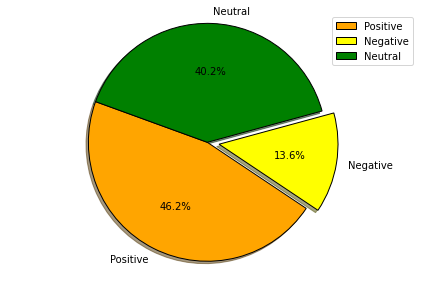

In [79]:
countpositive = df.loc[df["Score"]=="Positive"].shape[0]
countnegative = df.loc[df["Score"]=="Negative"].shape[0]
countneutral = df.loc[df["Score"]=="Neutral"].shape[0]
slices = [countpositive , countnegative , countneutral]
labels = ['Positive' , 'Negative', 'Neutral']
colors = ['orange' , 'yellow', 'green']
explode = [0 ,0.1 , 0]
plt.pie(slices ,labels = labels ,colors = colors , explode = explode , shadow =True ,startangle = 160, wedgeprops = {'edgecolor' :'black'},
        autopct = '%1.1f%%')
plt.axis('equal')
plt.legend()
plt.tight_layout()
plt.show()

In [80]:
from wordcloud import WordCloud

In [81]:
pos_tweets = df[df["Score"] =="Positive"]
pos_tweets.head(5)

,Id,User_name,Date,Tweets,Likes,Re-tweets,Reply,lang,Source,cleaned_tweets,lemmatized,Polarity,Score
0,1529249967868678145,"{'username': 'NickGolding4', 'id': 96863181579...",2022-05-24 23:56:19+00:00,"Strange one this, Guardiola is the obvious cho...",0,0,0,en,Twitter for iPhone,['strange' 'one' 'guardiola' 'obvious' 'choice...,[ strange one guardiola obvious choice however...,0.200000,Positive
5,1529247469686620161,"{'username': 'LFCDesMoines', 'id': 78091034245...",2022-05-24 23:46:23+00:00,We're so glad that Jürgen is the manager of th...,8,1,0,en,Twitter for Android,['glad' 'j' 'rgen' 'manager' 'season' 'upthere...,[ glad rgen manager season upthereds jurgenklo...,0.500000,Positive
7,1529246782408081408,"{'username': 'Marvin_again', 'id': 14337165343...",2022-05-24 23:43:39+00:00,Congratulations to the best Manager. Well dese...,6,2,0,en,Twitter for Android,['congratulations' 'best' 'manager' 'well' 'de...,[ congratulations best manager well deserved p...,1.000000,Positive
10,1529242757952323584,"{'username': '4231Narrow', 'id': 1526173513647...",2022-05-24 23:27:40+00:00,#Kevindebruyne : “ My assist to “#gundogan may...,0,0,0,en,Twitter for iPhone,['' 'kevindebruyne' 'assist' 'gundogan' 'maybe...,[ kevindebruyne assist gundogan maybe best ass...,1.000000,Positive
13,1529240781571112961,"{'username': 'Moamen_Aly7', 'id': 138309018092...",2022-05-24 23:19:48+00:00,People need to understand that the award isn’t...,2,1,0,en,Twitter for iPhone,['people' 'need' 'understand' 'award' 'premier...,[ people need understand award premierleague b...,0.216667,Positive


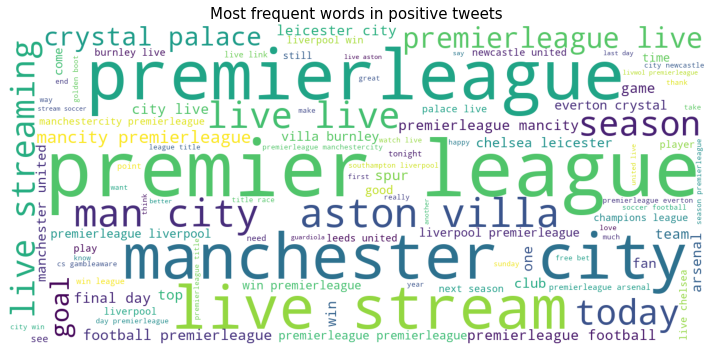

In [92]:
text =' '.join([word for word in pos_tweets['lemmatized']])
plt.figure(figsize=(10,5), facecolor='None')
wordcloud = WordCloud(max_words=100 , width= 1300 , height = 600,background_color ='white').generate(text)
plt.title('Most frequent words in positive tweets', fontsize=15)
plt.axis("off")
plt.imshow(wordcloud)
plt.tight_layout()
plt.show()

In [83]:
neg_tweets = df[df["Score"] =="Negative"]
neg_tweets.head(5)

,Id,User_name,Date,Tweets,Likes,Re-tweets,Reply,lang,Source,cleaned_tweets,lemmatized,Polarity,Score
43,1529226177889677312,"{'username': 'Doozy_45', 'id': 863377035661647...",2022-05-24 22:21:47+00:00,@premierleague @BarclaysFooty @LFC Pity Vote!!...,17,0,0,en,Twitter Web App,['' 'premierleague' 'barclaysfooty' 'lfc' 'pit...,[ premierleague barclaysfooty pity vote premie...,-0.100000,Negative
48,1529224217958432770,"{'username': 'crowthrice', 'id': 1373354382348...",2022-05-24 22:13:59+00:00,@DanThomasESPN Question: does the #PremierLeag...,0,0,0,en,Twitter Web App,['' 'danthomasespn' 'question' 'premierleague'...,[ danthomasespn question premierleague redunda...,-0.200000,Negative
56,1529222293158625280,"{'username': 'EnglishPre_b', 'id': 10540677089...",2022-05-24 22:06:20+00:00,BBC forced to apologise for labelling Man Utd ...,0,0,0,en,EnglishPre_Plow,['bbc' 'forced' 'apologise' 'labelling' 'man' ...,[ forced apologise labelling man rubbish fox s...,-0.300000,Negative
62,1529221038835261440,"{'username': 'garyhayles85', 'id': 12402945220...",2022-05-24 22:01:21+00:00,Eddie Howe just got what Sam Ryder got at Euro...,1,0,0,en,Twitter Web App,['eddie' 'howe' 'got' 'sam' 'ryder' 'got' 'eur...,[ eddie sam eurovision wins public fans favour...,-0.066667,Negative
90,1529213392594079744,"{'username': 'Doozy_45', 'id': 863377035661647...",2022-05-24 21:30:58+00:00,Pity vote... Let him have it. The public know ...,16,1,0,en,Twitter Web App,['pity' 'vote' 'let' 'public' 'know' 'real' 'w...,[ pity vote public know real winner remember h...,-0.175000,Negative


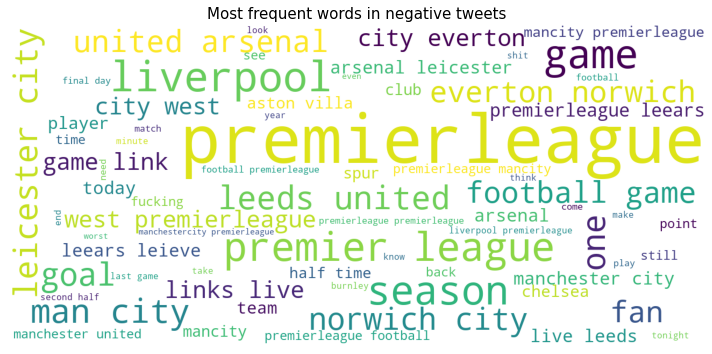

In [84]:
text =' '.join([word for word in neg_tweets['lemmatized']])
plt.figure(figsize=(10,5), facecolor='None')
wordcloud = WordCloud(max_words=70 , width=1300 , height = 600, background_color ='white').generate(text)
plt.imshow(wordcloud)
plt.axis("off")
plt.title('Most frequent words in negative tweets', fontsize=15)
plt.tight_layout()
plt.show()

In [85]:
neutral_tweets = df[df["Score"] =="Neutral"]
neutral_tweets.head(5)

,Id,User_name,Date,Tweets,Likes,Re-tweets,Reply,lang,Source,cleaned_tweets,lemmatized,Polarity,Score
1,1529249495539654659,"{'username': 'fansnetwork', 'id': 126313186, '...",2022-05-24 23:54:26+00:00,Raphinha submits transfer request but Leeds on...,1,0,0,en,IFTTT,['raphinha' 'submits' 'transfer' 'request' 'le...,[ raphinha submits transfer request leeds verg...,0.0,Neutral
2,1529249438702632960,"{'username': 'AdwaitYNWA', 'id': 763347049, 'd...",2022-05-24 23:54:12+00:00,Congratulations Boss! Very Well Deserved!💪 🔴🔴...,3,1,0,en,Twitter for Android,['congratulations' 'boss' 'well' 'deserved' 'y...,[ congratulations boss well deserved jurgenklo...,0.0,Neutral
3,1529249384025960449,"{'username': 'media_vendetta', 'id': 953117798...",2022-05-24 23:53:59+00:00,2021-22 EPL: SEASON PREDICTIONS REVISITED #Pr...,5,4,0,en,Twitter Web App,['' 'epl' 'season' 'predictions' 'revisited' '...,[ season predictions revisited premierleague h...,0.0,Neutral
4,1529247987477622784,"{'username': 'kamakam98266408', 'id': 13593831...",2022-05-24 23:48:26+00:00,The Premier League ended - Manchester City sco...,0,0,0,en,Twitter Web App,['premier' 'league' 'ended' 'manchester' 'city...,[ premier league ended manchester city scored ...,0.0,Neutral
6,1529247055520088066,"{'username': 'Doozy_45', 'id': 863377035661647...",2022-05-24 23:44:44+00:00,Gabriel Jesus told he still has role in Man Ci...,61,5,2,en,Twitter Web App,['gabriel' 'jesus' 'told' 'still' 'role' 'man'...,[ gabriel jesus told still role man city squad...,0.0,Neutral


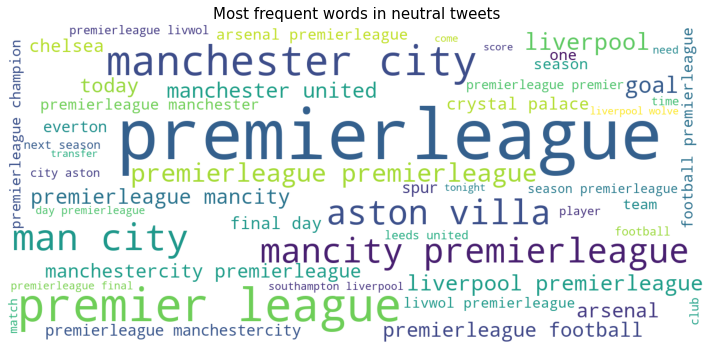

In [93]:
text =' '.join([word for word in neutral_tweets['lemmatized']])
plt.figure(figsize=(10,5), facecolor='None')
wordcloud = WordCloud(max_words=50 , width=1300 , height = 600, background_color ='white').generate(text)
plt.imshow(wordcloud)
plt.axis("off")
plt.title('Most frequent words in neutral tweets', fontsize=15)
plt.tight_layout()
plt.show()

In [94]:
df['lemmatized'].dtypes

string[python]

In [95]:
data = df.head(1000)

In [96]:
data

,Id,User_name,Date,Tweets,Likes,Re-tweets,Reply,lang,Source,cleaned_tweets,lemmatized,Polarity,Score
0,1529249967868678145,"{'username': 'NickGolding4', 'id': 96863181579...",2022-05-24 23:56:19+00:00,"Strange one this, Guardiola is the obvious cho...",0,0,0,en,Twitter for iPhone,['strange' 'one' 'guardiola' 'obvious' 'choice...,[ strange one guardiola obvious choice however...,2.000000e-01,Positive
1,1529249495539654659,"{'username': 'fansnetwork', 'id': 126313186, '...",2022-05-24 23:54:26+00:00,Raphinha submits transfer request but Leeds on...,1,0,0,en,IFTTT,['raphinha' 'submits' 'transfer' 'request' 'le...,[ raphinha submits transfer request leeds verg...,0.000000e+00,Neutral
2,1529249438702632960,"{'username': 'AdwaitYNWA', 'id': 763347049, 'd...",2022-05-24 23:54:12+00:00,Congratulations Boss! Very Well Deserved!💪 🔴🔴...,3,1,0,en,Twitter for Android,['congratulations' 'boss' 'well' 'deserved' 'y...,[ congratulations boss well deserved jurgenklo...,0.000000e+00,Neutral
3,1529249384025960449,"{'username': 'media_vendetta', 'id': 953117798...",2022-05-24 23:53:59+00:00,2021-22 EPL: SEASON PREDICTIONS REVISITED #Pr...,5,4,0,en,Twitter Web App,['' 'epl' 'season' 'predictions' 'revisited' '...,[ season predictions revisited premierleague h...,0.000000e+00,Neutral
4,1529247987477622784,"{'username': 'kamakam98266408', 'id': 13593831...",2022-05-24 23:48:26+00:00,The Premier League ended - Manchester City sco...,0,0,0,en,Twitter Web App,['premier' 'league' 'ended' 'manchester' 'city...,[ premier league ended manchester city scored ...,0.000000e+00,Neutral
5,1529247469686620161,"{'username': 'LFCDesMoines', 'id': 78091034245...",2022-05-24 23:46:23+00:00,We're so glad that Jürgen is the manager of th...,8,1,0,en,Twitter for Android,['glad' 'j' 'rgen' 'manager' 'season' 'upthere...,[ glad rgen manager season upthereds jurgenklo...,5.000000e-01,Positive
6,1529247055520088066,"{'username': 'Doozy_45', 'id': 863377035661647...",2022-05-24 23:44:44+00:00,Gabriel Jesus told he still has role in Man Ci...,61,5,2,en,Twitter Web App,['gabriel' 'jesus' 'told' 'still' 'role' 'man'...,[ gabriel jesus told still role man city squad...,0.000000e+00,Neutral
7,1529246782408081408,"{'username': 'Marvin_again', 'id': 14337165343...",2022-05-24 23:43:39+00:00,Congratulations to the best Manager. Well dese...,6,2,0,en,Twitter for Android,['congratulations' 'best' 'manager' 'well' 'de...,[ congratulations best manager well deserved p...,1.000000e+00,Positive
8,1529246642137837568,"{'username': 'CFCsingh3101', 'id': 4200868812,...",2022-05-24 23:43:06+00:00,"Premier League 2021/22 Reece James - 1865min,...",0,1,1,en,Twitter for Android,['premier' 'league' 'reece' 'james' 'min' 'g' ...,[ premier league reece james g trent alexander...,0.000000e+00,Neutral
9,1529243221422792704,"{'username': 'padhimitesh', 'id': 3106541833, ...",2022-05-24 23:29:30+00:00,@goal @LFC So a manager who won the league is ...,0,0,0,en,Twitter for Android,['' 'goal' 'lfc' 'manager' 'league' 'ignored' ...,[ goal manager league ignored one came second ...,0.000000e+00,Neutral


# Tf - idf  Vectorizer
Term Frequency - Inverse Documnet Frequency
tf = how frequently term occurs in a documemt                    

idf = weight of rare words
The weight that word occurs rarely in the sentence have high IDF score.


TF(t)=(Number of lines term t appear in a documnet)/total number of terms in the document.  

eg.
Piford provide training to students and also provide training to the workproffessionals.                                          Tf(Piford) = 1/12                                                                   
Tf(training) =2/12                                              
                                                                 
            
IDF(t) = log(toatl number of documents)/Number of documents with term t in it.            
eg.
1.Piford provide training to students.
2.Piford is a software development company.
3.We provide placement after trainings.
IDF(Piford) = log 3/2                                                                 
IDF(software) = log 3/1                                                                 
Tf-idf = Tf*idf  

In [97]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [98]:
import gc
gc.collect()

26854

In [99]:
vectorizer = TfidfVectorizer(max_features=300)

In [100]:
input = vectorizer.fit_transform(data['lemmatized'])

In [101]:
d = pd.DataFrame(vectorizer.get_feature_names())

C:\Users\thaku\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [102]:
d.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299
0,abramovich,add,ahead,already,also,always,anfield,announced,another,antonio,app,approval,approved,approves,arsenal,asian,aston,astonvilla,award,back,barclays,behind,best,better,bid,big,biggest,billion,blue,board,boehly,boot,boss,breaking,bundesliga,burnley,buy,celebrating,centre,champions,championship,championsleague,championsleaguefinal,check,chelsea,city,clear,club,clubs,coach,come,comeback,coming,complete,congratulations,consortium,content,contract,could,country,course,cup,day,days,deal,defensive,difference,done,download,eddie,end,england,english,eriktenhag,erling,europe,european,even,ever,everton,every,everyone,expected,family,fan,fans,feel,fifa,final,finished,first,five,flop,following,football,forward,fourth,free,full,future,game,games,get,give,goal,goalkeeper,goals,golden,goldenboot,good,government,grealish,great,guardiola,gundogan,gunners,hard,head,help,hero,highlights,history,home,hope,improved,incredible,india,interest,jack,jackgrealish,james,jesus,jurgen,jurgenklopp,kalvin,know,last,league,led,leeds,left,leicester,life,link,listen,live,liverpool,look,looking,love,made,madrid,make,man,manager,manchester,manchestercity,manchesterunited,mancity,manunited,match,may,metaverse,midfielder,might,million,minutes,money,months,mosalah,move,much,name,named,need,never,new,newcastle,news,next,number,official,one,open,owner,ownership,paper,parade,part,people,pepguardiola,phillips,pitch,play,played,player,players,playing,playoffs,point,points,preakness,premier,premierleague,proposed,raheem,read,real,recap,report,review,right,roman,ronaldo,rubbish,said,salah,sale,say,says,scored,season,seasons,second,see,seriea,set,share,side,sign,signing,since,soccer,son,sonny,soriano,space,spent,sports,spurs,squad,star,start,stay,step,sterling,still,striker,summer,sunday,table,take,takeover,talk,talks,target,team,ten,thank,thanks,things,think,thomas,three,tielemans,time,title,titles,today,top,transfer,transfers,trophy,tue,tuesday,tuesdaymotivations,two,united,video,villa,want,watch,way,week,weekend,welcome,well,west,westham,win,winner,winners,winning,wins,wolves,world,would,year,years,youtube


In [103]:
vocab = pd.DataFrame(input.todense(), columns=vectorizer.get_feature_names())

C:\Users\thaku\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [104]:
vocab.head(5)

,abramovich,add,ahead,already,also,always,anfield,announced,another,antonio,app,approval,approved,approves,arsenal,asian,aston,astonvilla,award,back,barclays,behind,best,better,bid,big,biggest,billion,blue,board,boehly,boot,boss,breaking,bundesliga,burnley,buy,celebrating,centre,champions,championship,championsleague,championsleaguefinal,check,chelsea,city,clear,club,clubs,coach,come,comeback,coming,complete,congratulations,consortium,content,contract,could,country,course,cup,day,days,deal,defensive,difference,done,download,eddie,end,england,english,eriktenhag,erling,europe,european,even,ever,everton,every,everyone,expected,family,fan,fans,feel,fifa,final,finished,first,five,flop,following,football,forward,fourth,free,full,future,game,games,get,give,goal,goalkeeper,goals,golden,goldenboot,good,government,grealish,great,guardiola,gundogan,gunners,hard,head,help,hero,highlights,history,home,hope,improved,incredible,india,interest,jack,jackgrealish,james,jesus,jurgen,jurgenklopp,kalvin,know,last,league,led,leeds,left,leicester,life,link,listen,live,liverpool,look,looking,love,made,madrid,make,man,manager,manchester,manchestercity,manchesterunited,mancity,manunited,match,may,metaverse,midfielder,might,million,minutes,money,months,mosalah,move,much,name,named,need,never,new,newcastle,news,next,number,official,one,open,owner,ownership,paper,parade,part,people,pepguardiola,phillips,pitch,play,played,player,players,playing,playoffs,point,points,preakness,premier,premierleague,proposed,raheem,read,real,recap,report,review,right,roman,ronaldo,rubbish,said,salah,sale,say,says,scored,season,seasons,second,see,seriea,set,share,side,sign,signing,since,soccer,son,sonny,soriano,space,spent,sports,spurs,squad,star,start,stay,step,sterling,still,striker,summer,sunday,table,take,takeover,talk,talks,target,team,ten,thank,thanks,things,think,thomas,three,tielemans,time,title,titles,today,top,transfer,transfers,trophy,tue,tuesday,tuesdaymotivations,two,united,video,villa,want,watch,way,week,weekend,welcome,well,west,westham,win,winner,winners,winning,wins,wolves,world,would,year,years,youtube
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.407077,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.280064,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.418278,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.361069,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.388574,0.00000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.28877,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.317681,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.078273,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.330304,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.

In [105]:
print(len(vectorizer.vocabulary_)) # calculate unique words

300


In [106]:
vectorizer.vocabulary_   # assign numeric values to words

{'one': 182,
 'guardiola': 113,
 'eddie': 69,
 'last': 136,
 'time': 265,
 'award': 18,
 'champions': 39,
 'manager': 154,
 'premierleague': 203,
 'transfer': 270,
 'leeds': 139,
 'signing': 230,
 'congratulations': 54,
 'boss': 32,
 'well': 286,
 'jurgenklopp': 133,
 'season': 221,
 'premier': 202,
 'league': 137,
 'manchester': 155,
 'city': 45,
 'scored': 220,
 'three': 263,
 'goals': 106,
 'five': 91,
 'minutes': 166,
 'title': 266,
 'years': 298,
 'titles': 267,
 'manchestercity': 156,
 'jesus': 131,
 'still': 246,
 'man': 153,
 'squad': 240,
 'erling': 74,
 'best': 22,
 'james': 130,
 'liverpool': 146,
 'football': 94,
 'goal': 104,
 'second': 223,
 'gundogan': 114,
 'breaking': 33,
 'barclays': 20,
 'jurgen': 132,
 'people': 189,
 'need': 174,
 'coach': 49,
 'year': 297,
 'team': 256,
 'played': 194,
 'every': 80,
 'game': 100,
 'finished': 89,
 'behind': 21,
 'winners': 291,
 'expected': 82,
 'win': 289,
 'big': 25,
 'side': 228,
 'soccer': 232,
 'love': 149,
 'never': 175,
 't

In [107]:

print(input.shape)

(1000, 300)


In [108]:
output = data['Score']
output.head(3)

0    Positive
1     Neutral
2     Neutral
Name: Score, dtype: object

In [109]:
from sklearn.model_selection import train_test_split

In [110]:
x_train , x_test , y_train , y_test = train_test_split(vocab , output , test_size = 0.3 , random_state = 3)

In [111]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(700, 300)
(300, 300)
(700,)
(300,)


In [112]:
y_train.value_counts()

Positive    333
Neutral     274
Negative     93
Name: Score, dtype: int64

In [113]:
SMOTE = SMOTE(random_state = 3)

In [114]:
x_train_SMOTE , y_train_SMOTE = SMOTE.fit_resample(x_train , y_train)

In [115]:
y_train_SMOTE.value_counts()

Positive    333
Negative    333
Neutral     333
Name: Score, dtype: int64

In [116]:
import warnings
warnings.filterwarnings("ignore")

In [117]:
SVM_tf = svm.SVC(kernel = 'linear')

In [118]:
svm_model =SVM_tf.fit(x_train_SMOTE , y_train_SMOTE)

In [119]:
svm_predict = svm_model.predict(x_test)

In [120]:
svm_accuracy = accuracy_score(y_test , svm_predict)*100
print("accuracy of svm :" , round(svm_accuracy, 2), "%")

accuracy of svm : 61.33 %


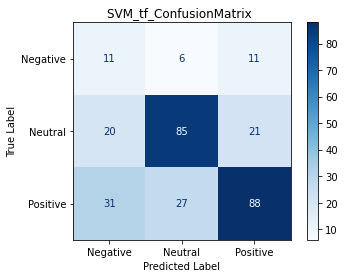

In [121]:
matrix = plot_confusion_matrix(SVM_tf, x_test ,y_test, cmap=plt.cm.Blues)
matrix.ax_.set_title('SVM_tf_ConfusionMatrix ')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [122]:
knn_tf = KNeighborsClassifier()
knn_model = knn_tf.fit(x_train_SMOTE , y_train_SMOTE)
knn_pred =knn_model.predict(x_test)
knn_acc = accuracy_score(y_test , knn_pred)*100
print("accuracy of knn :" , round(knn_acc, 2), "%")

accuracy of knn : 35.33 %


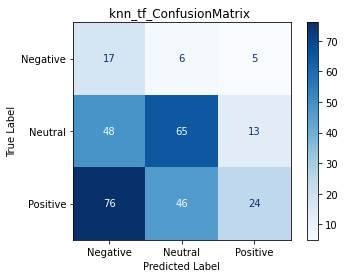

In [123]:
matrix = plot_confusion_matrix(knn_tf, x_test ,y_test, cmap=plt.cm.Blues)
matrix.ax_.set_title('knn_tf_ConfusionMatrix ')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [124]:
from sklearn.ensemble import RandomForestClassifier

In [125]:
RFC_tf = RandomForestClassifier(n_estimators = 80 , max_depth = 50)

In [126]:
RFC_model = RFC_tf.fit(x_train_SMOTE , y_train_SMOTE)

In [127]:
pred_RFC = RFC_model.predict(x_test)

In [128]:
RFC_acc = accuracy_score(y_test , pred_RFC)*100
print("accuracy of RFC :" , round(RFC_acc, 2), "%")

accuracy of RFC : 73.0 %


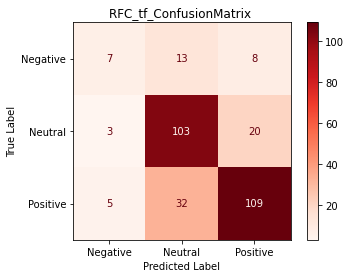

In [129]:
matrix = plot_confusion_matrix(RFC_tf, x_test ,y_test, cmap=plt.cm.Reds)
matrix.ax_.set_title('RFC_tf_ConfusionMatrix ')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [130]:
labels = ['KNN','Random Forest Classifier','SVM']
accuracy = [knn_acc, RFC_acc,svm_accuracy]
eval = pd.DataFrame()
eval['Model'] = labels
eval["Accuracy"] = accuracy                      
eval

,Model,Accuracy
0,KNN,35.333333
1,Random Forest Classifier,73.000000
2,SVM,61.333333


Text(0, 0.5, 'Accuracy')

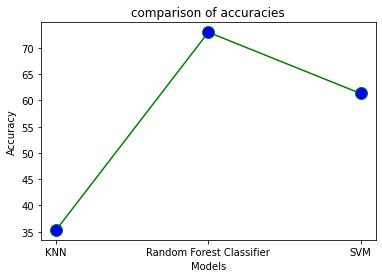

In [131]:
x = eval['Model']
y = eval["Accuracy"]
plt.plot(x , y, color='green', linestyle='solid', 
         marker='o', markerfacecolor='blue', markersize=12)
plt.title('comparison of accuracies')
plt.xlabel('Models')
plt.ylabel('Accuracy')

In [132]:
from sklearn.feature_extraction.text import CountVectorizer

In [133]:
count = CountVectorizer(max_features=300)

In [134]:
countinput = count.fit_transform(data['lemmatized'])

In [135]:
C = pd.DataFrame(count.get_feature_names())

In [136]:
C.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299
0,abramovich,add,ahead,already,also,always,anfield,announced,another,antonio,app,approval,approved,approves,arsenal,asian,aston,astonvilla,award,back,barclays,behind,best,better,bid,big,biggest,billion,blue,board,boehly,boot,boss,breaking,bundesliga,burnley,buy,celebrating,centre,champions,championship,championsleague,championsleaguefinal,check,chelsea,city,clear,club,clubs,coach,come,comeback,coming,complete,congratulations,consortium,content,contract,could,country,course,cup,day,days,deal,defensive,difference,done,download,eddie,end,england,english,eriktenhag,erling,europe,european,even,ever,everton,every,everyone,expected,family,fan,fans,feel,fifa,final,finished,first,five,flop,following,football,forward,fourth,free,full,future,game,games,get,give,goal,goalkeeper,goals,golden,goldenboot,good,government,grealish,great,guardiola,gundogan,gunners,hard,head,help,hero,highlights,history,home,hope,improved,incredible,india,interest,jack,jackgrealish,james,jesus,jurgen,jurgenklopp,kalvin,know,last,league,led,leeds,left,leicester,life,link,listen,live,liverpool,look,looking,love,made,madrid,make,man,manager,manchester,manchestercity,manchesterunited,mancity,manunited,match,may,metaverse,midfielder,might,million,minutes,money,months,mosalah,move,much,name,named,need,never,new,newcastle,news,next,number,official,one,open,owner,ownership,paper,parade,part,people,pepguardiola,phillips,pitch,play,played,player,players,playing,playoffs,point,points,preakness,premier,premierleague,proposed,raheem,read,real,recap,report,review,right,roman,ronaldo,rubbish,said,salah,sale,say,says,scored,season,seasons,second,see,seriea,set,share,side,sign,signing,since,soccer,son,sonny,soriano,space,spent,sports,spurs,squad,star,start,stay,step,sterling,still,striker,summer,sunday,table,take,takeover,talk,talks,target,team,ten,thank,thanks,things,think,thomas,three,tielemans,time,title,titles,today,top,transfer,transfers,trophy,tue,tuesday,tuesdaymotivations,two,united,video,villa,want,watch,way,week,weekend,welcome,well,west,westham,win,winner,winners,winning,wins,wolves,world,would,year,years,youtube


In [138]:
count.vocabulary_

{'one': 182,
 'guardiola': 113,
 'eddie': 69,
 'last': 136,
 'time': 265,
 'award': 18,
 'champions': 39,
 'manager': 154,
 'premierleague': 203,
 'transfer': 270,
 'leeds': 139,
 'signing': 230,
 'congratulations': 54,
 'boss': 32,
 'well': 286,
 'jurgenklopp': 133,
 'season': 221,
 'premier': 202,
 'league': 137,
 'manchester': 155,
 'city': 45,
 'scored': 220,
 'three': 263,
 'goals': 106,
 'five': 91,
 'minutes': 166,
 'title': 266,
 'years': 298,
 'titles': 267,
 'manchestercity': 156,
 'jesus': 131,
 'still': 246,
 'man': 153,
 'squad': 240,
 'erling': 74,
 'best': 22,
 'james': 130,
 'liverpool': 146,
 'football': 94,
 'goal': 104,
 'second': 223,
 'gundogan': 114,
 'breaking': 33,
 'barclays': 20,
 'jurgen': 132,
 'people': 189,
 'need': 174,
 'coach': 49,
 'year': 297,
 'team': 256,
 'played': 194,
 'every': 80,
 'game': 100,
 'finished': 89,
 'behind': 21,
 'winners': 291,
 'expected': 82,
 'win': 289,
 'big': 25,
 'side': 228,
 'soccer': 232,
 'love': 149,
 'never': 175,
 't

In [139]:
countv = pd.DataFrame(countinput.todense(), columns=count.get_feature_names())

In [140]:
countv.head(5)

,abramovich,add,ahead,already,also,always,anfield,announced,another,antonio,app,approval,approved,approves,arsenal,asian,aston,astonvilla,award,back,barclays,behind,best,better,bid,big,biggest,billion,blue,board,boehly,boot,boss,breaking,bundesliga,burnley,buy,celebrating,centre,champions,championship,championsleague,championsleaguefinal,check,chelsea,city,clear,club,clubs,coach,come,comeback,coming,complete,congratulations,consortium,content,contract,could,country,course,cup,day,days,deal,defensive,difference,done,download,eddie,end,england,english,eriktenhag,erling,europe,european,even,ever,everton,every,everyone,expected,family,fan,fans,feel,fifa,final,finished,first,five,flop,following,football,forward,fourth,free,full,future,game,games,get,give,goal,goalkeeper,goals,golden,goldenboot,good,government,grealish,great,guardiola,gundogan,gunners,hard,head,help,hero,highlights,history,home,hope,improved,incredible,india,interest,jack,jackgrealish,james,jesus,jurgen,jurgenklopp,kalvin,know,last,league,led,leeds,left,leicester,life,link,listen,live,liverpool,look,looking,love,made,madrid,make,man,manager,manchester,manchestercity,manchesterunited,mancity,manunited,match,may,metaverse,midfielder,might,million,minutes,money,months,mosalah,move,much,name,named,need,never,new,newcastle,news,next,number,official,one,open,owner,ownership,paper,parade,part,people,pepguardiola,phillips,pitch,play,played,player,players,playing,playoffs,point,points,preakness,premier,premierleague,proposed,raheem,read,real,recap,report,review,right,roman,ronaldo,rubbish,said,salah,sale,say,says,scored,season,seasons,second,see,seriea,set,share,side,sign,signing,since,soccer,son,sonny,soriano,space,spent,sports,spurs,squad,star,start,stay,step,sterling,still,striker,summer,sunday,table,take,takeover,talk,talks,target,team,ten,thank,thanks,things,think,thomas,three,tielemans,time,title,titles,today,top,transfer,transfers,trophy,tue,tuesday,tuesdaymotivations,two,united,video,villa,want,watch,way,week,weekend,welcome,well,west,westham,win,winner,winners,winning,wins,wolves,world,would,year,years,youtube
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [141]:
x_train , x_test , y_train , y_test = train_test_split(countv , output , test_size = 0.3 , random_state = 3)

In [142]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(700, 300)
(300, 300)
(700,)
(300,)


In [143]:
y_train.value_counts()

Positive    333
Neutral     274
Negative     93
Name: Score, dtype: int64

In [146]:
SMOTE = SMOTE(random_state = 3)

In [147]:
x_train_SMOTE , y_train_SMOTE = SMOTE.fit_resample(x_train , y_train)

In [148]:
y_train_SMOTE.value_counts()

Positive    333
Negative    333
Neutral     333
Name: Score, dtype: int64

In [149]:
classifier = svm.SVC(kernel = 'linear')
svc_model = classifier.fit(x_train_SMOTE , y_train_SMOTE)
svc_pred =svc_model.predict(x_test)
svc_acc = accuracy_score(y_test , svc_pred)*100
print("accuracy of svc :" , round(svc_acc, 2), "%")

accuracy of svc : 60.0 %


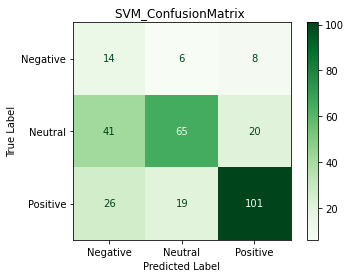

In [150]:
matrix = plot_confusion_matrix(classifier, x_test ,y_test, cmap=plt.cm.Greens)
matrix.ax_.set_title('SVM_ConfusionMatrix ')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [151]:
knn = KNeighborsClassifier()
knn_model = knn.fit(x_train_SMOTE , y_train_SMOTE)
knn_pred =knn_model.predict(x_test)
knn_acc = accuracy_score(y_test , knn_pred)*100
print("accuracy of knn :" , round(knn_acc, 2), "%")

accuracy of knn : 28.33 %


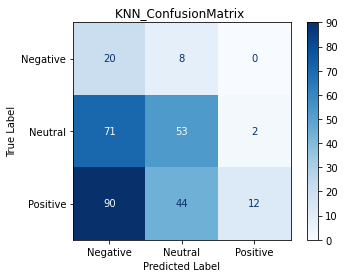

In [152]:
matrix = plot_confusion_matrix(knn, x_test ,y_test, cmap=plt.cm.Blues)
matrix.ax_.set_title('KNN_ConfusionMatrix ')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [153]:
from sklearn.ensemble import RandomForestClassifier

In [154]:
RFC = RandomForestClassifier(n_estimators = 80 , max_depth = 50)
RFC_model = RFC.fit(x_train_SMOTE , y_train_SMOTE)
pred_RFC = RFC_model.predict(x_test)
RFC_acc = accuracy_score(y_test , pred_RFC)*100
print("accuracy of RFC :" , round(RFC_acc, 2), "%")

accuracy of RFC : 63.33 %


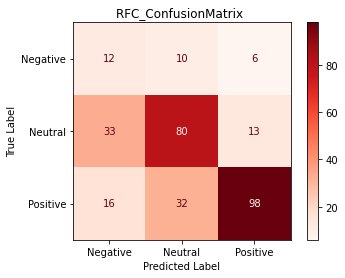

In [155]:
matrix = plot_confusion_matrix(RFC, x_test ,y_test, cmap=plt.cm.Reds)
matrix.ax_.set_title('RFC_ConfusionMatrix ')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [156]:
labels = ['KNN','Random Forest Classifier','SVM']
accuracy = [knn_acc, RFC_acc,svm_accuracy]
eval = pd.DataFrame()
eval['Model'] = labels
eval["Accuracy"] = accuracy                      
eval

,Model,Accuracy
0,KNN,28.333333
1,Random Forest Classifier,63.333333
2,SVM,61.333333


Text(0, 0.5, 'Accuracy')

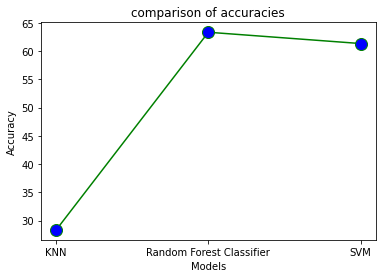

In [157]:
x = eval['Model']
y = eval["Accuracy"]
plt.plot(x , y, color='green', linestyle='solid', 
         marker='o', markerfacecolor='blue', markersize=12)
plt.title('comparison of accuracies')
plt.xlabel('Models')
plt.ylabel('Accuracy')